In [1]:
from IPython.display import display, HTML

# Define CSS styles to hide elements with class 'hide'
display(HTML("""
    <style>
        .hide { display: none; }
    </style>
"""))

# HTML content that you want to hide
display(HTML("""
    <div class="hide">
        <link rel="preconnect" href="https://fonts.googleapis.com">
        <link rel="preconnect" href="https://fonts.gstatic.com" crossorigin>
        <link href="https://fonts.googleapis.com/css2?family=Kalnia+Glaze:wght@100..700&display=swap" rel="stylesheet">
    </div>
"""))



<p style="color:blue; font-size:50px; font-weight:bold; text-align:center; font-family:'Kalnia Glaze', sans-serif;">Telco Churn Prediction By Using Tensorflow</p>

<p style="color:pink; font-size:30px; font-weight:bold; text-align:center;"> Jenifer Mayang Jues</p>


![Header Image](https://img.freepik.com/free-photo/futuristic-smart-city-with-5g-global-network-technology_53876-98438.jpg?t=st=1721893604~exp=1721897204~hmac=961167e30a72e9acfb75a94afd98745034b36b3ad82577df227e14fdaeb9bb12&w=740)

In [3]:
import os
os.getcwd()

'C:\\Users\\jenif\\Documents\\My Data Science Project\\Telco Churn Prediction'

In [5]:
os.chdir('/Users/jenif/Documents/My Data Science Project/Telco Churn Prediction/Dataset')

## 1. Data Load: Telco Churn Dataset

In [7]:
import numpy as np
import pandas as pd

rdf=pd.read_csv("clean_telco_churn.csv")

In [9]:
rdf.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [11]:
raw_df= pd.DataFrame(rdf)

## 2. Data Understanding

In [13]:
raw_df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

#### Univariate analysis

#### a. Barplot

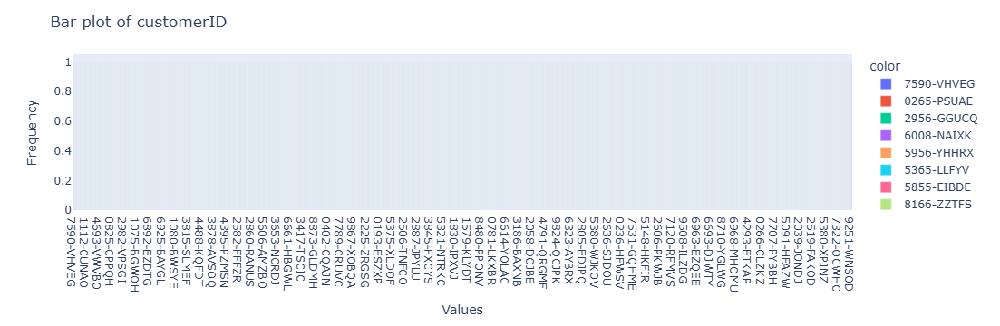

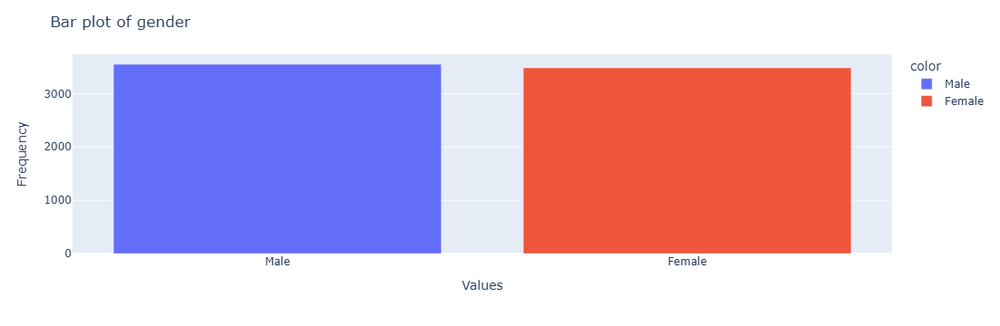

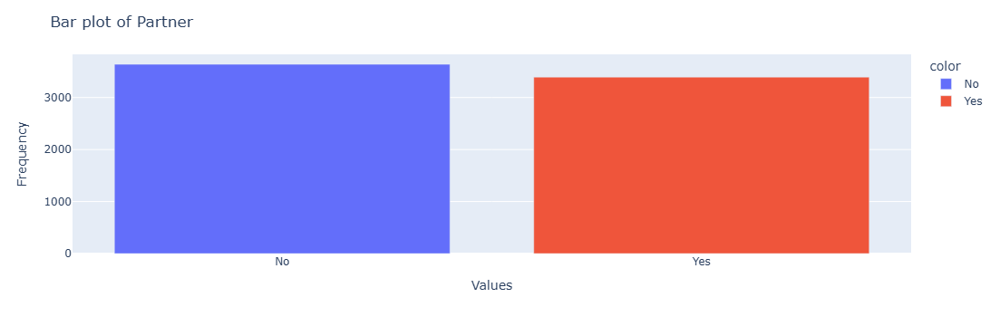

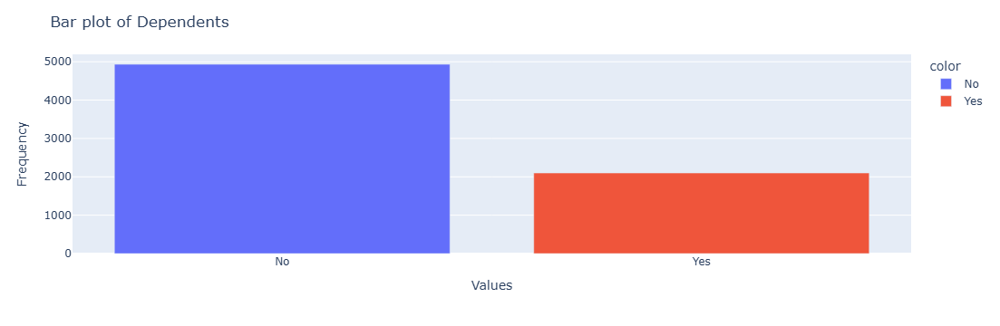

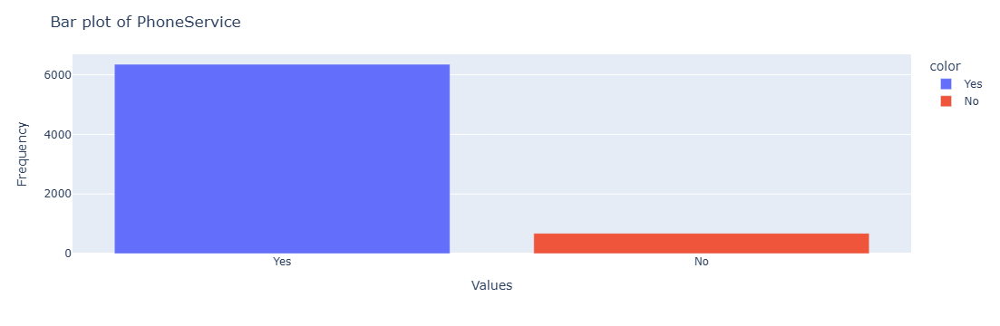

...

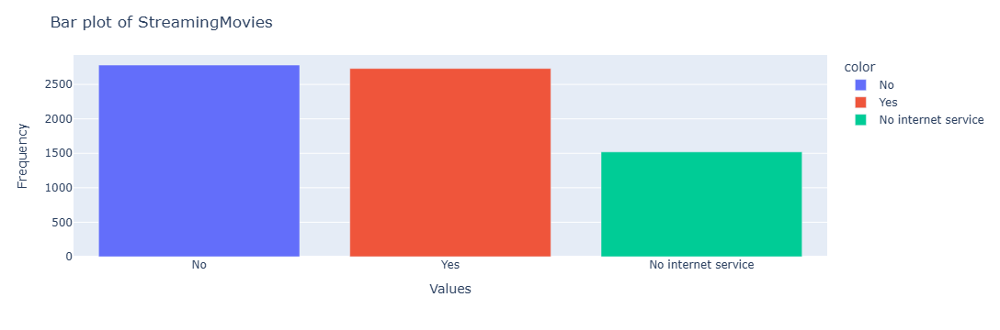

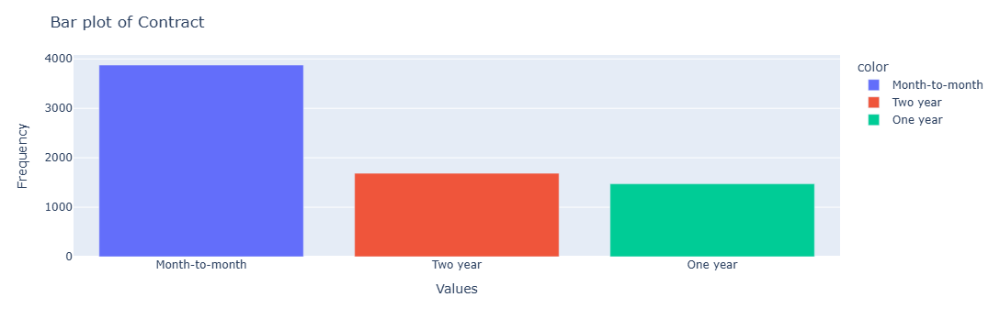

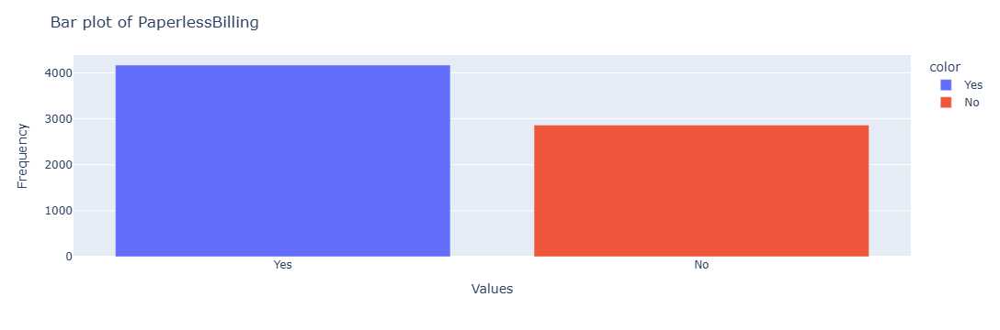

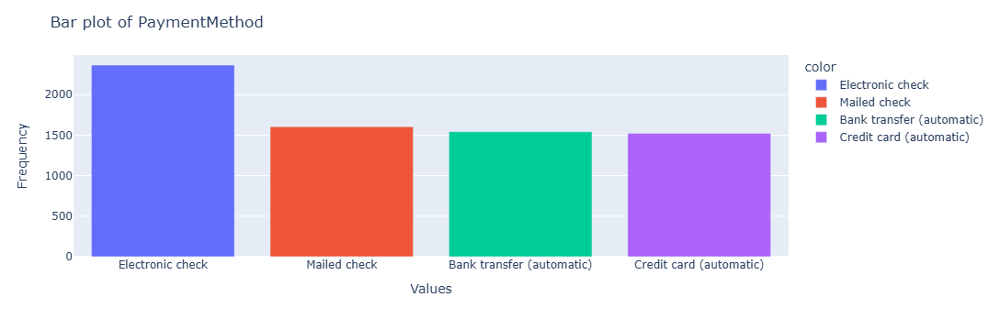

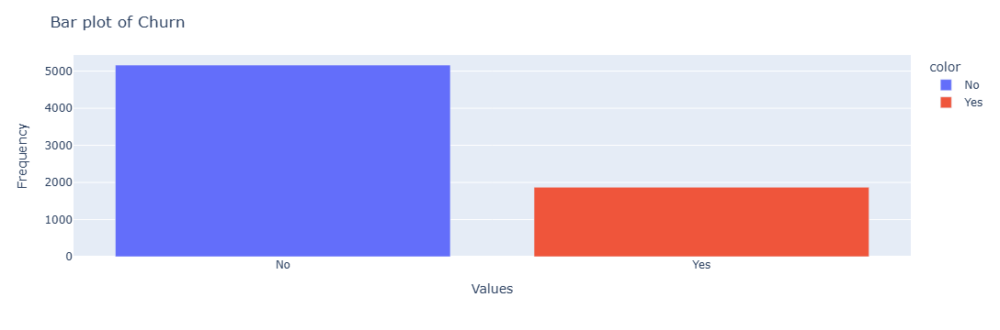

In [15]:
import plotly.express as px
categorical_columns = raw_df.select_dtypes(include=['object'])

# Plot count plot for each categorical column
for column in categorical_columns:
    counts = categorical_columns[column].value_counts()
    fig = px.bar(x=counts.index, y=counts.values, color=counts.index)
    fig.update_layout(
        title=f'Bar plot of {column}',
        xaxis_title='Values',
        yaxis_title='Frequency'
    )
    fig.show()
#### a. Barplot

#### b. Pie chart for categorical columns

## 3. Data Cleaning

### 3.1 Handling inconsistent data
###### Identify inconsistent data using unique values

In [17]:
for column in raw_df.columns:
    unique_values = raw_df[column].unique()
    print(f"Unique values {column}: {unique_values}")

Unique values customerID: ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']
Unique values gender: ['Female' 'Male']
Unique values SeniorCitizen: [0 1]
Unique values Partner: ['Yes' 'No']
Unique values Dependents: ['No' 'Yes']
Unique values tenure: [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26 39]
Unique values PhoneService: ['No' 'Yes']
Unique values MultipleLines: ['No phone service' 'No' 'Yes']
Unique values InternetService: ['DSL' 'Fiber optic' 'No']
Unique values OnlineSecurity: ['No' 'Yes' 'No internet service']
Unique values OnlineBackup: ['Yes' 'No' 'No internet service']
Unique values DeviceProtection: ['No' 'Yes' 'No internet service']
Unique values TechSupport: ['No' 'Yes' 'No internet service']
Unique values StreamingTV: ['No' 'Yes' 'No internet service']
Unique values Stre

### 3. 3 Handling Missing Data

#### Visualizing Missing Data

<Axes: >

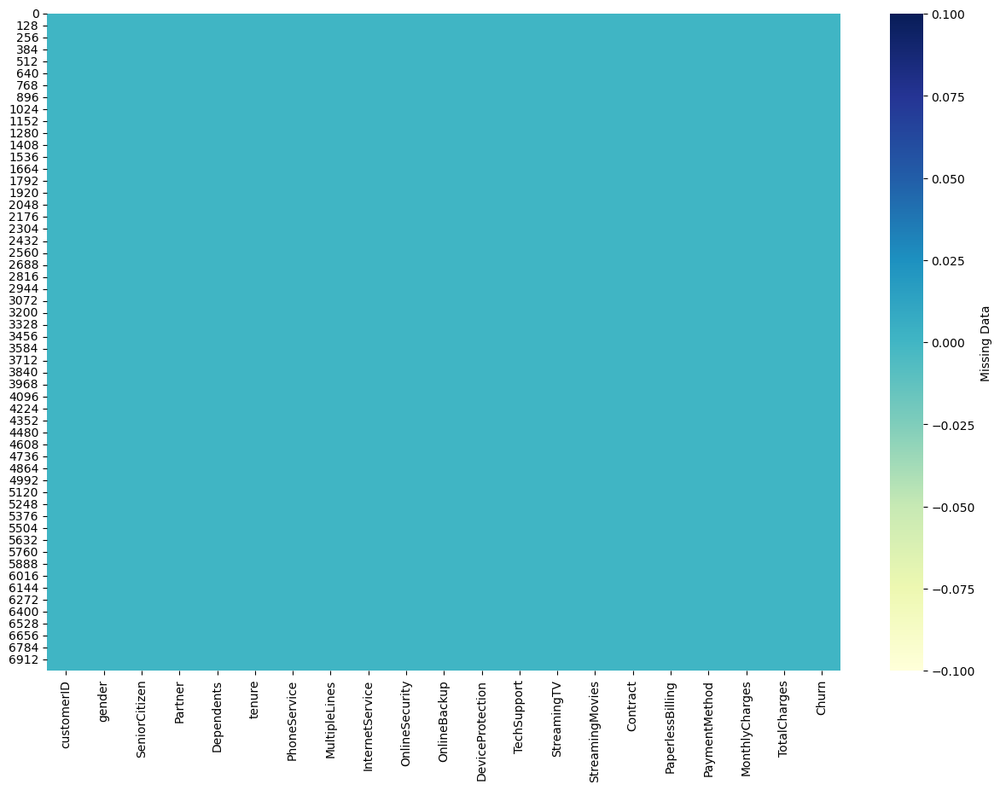

In [19]:
# Visualizing Missing Data using Seaborn heatmap()

import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(15,10))
sns.heatmap(raw_df.isna(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

##### Percentage of missing values

In [21]:
#Calculate percentage of missing values
raw_df.isnull().mean() * 100

customerID          0.0
gender              0.0
SeniorCitizen       0.0
Partner             0.0
Dependents          0.0
tenure              0.0
PhoneService        0.0
MultipleLines       0.0
InternetService     0.0
OnlineSecurity      0.0
OnlineBackup        0.0
DeviceProtection    0.0
TechSupport         0.0
StreamingTV         0.0
StreamingMovies     0.0
Contract            0.0
PaperlessBilling    0.0
PaymentMethod       0.0
MonthlyCharges      0.0
TotalCharges        0.0
Churn               0.0
dtype: float64

### 4.0 Data Manipulation

In [23]:
raw_df['TotalCharges'] = pd.to_numeric(raw_df.TotalCharges, errors='coerce')
raw_df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

After data manipulation was performed, it is noticed that there are 11 missing values found for Total Charges column.

In [25]:
raw_df.drop(labels=raw_df[raw_df['tenure'] == 0].index, axis=0, inplace=True)
raw_df[raw_df['tenure'] == 0].index


Index([], dtype='int64')

***Data Imputation for missing values using mean value***

In [27]:
raw_df.fillna(raw_df["TotalCharges"].mean())

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7027,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7028,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7029,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7030,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


##### rechecking missing value after imputation

In [29]:
raw_df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [31]:
file_path = 'clean_telco_churn.csv'  

# Save the DataFrame to a CSV file
raw_df.to_csv(file_path, index=False) 

##### Creating a new copy of clean dataset

In [33]:
cdf = pd.DataFrame(raw_df.copy())

In [35]:
cdf.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


### 5. Exploratory Data Analysis

In [37]:
cdf = cdf.drop(['customerID'], axis = 1)

In [39]:
cdf["SeniorCitizen"]= cdf["SeniorCitizen"].map({0: "No", 1: "Yes"})
cdf.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,No,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,No,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,No,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,No,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [41]:
# 1️⃣ Separate features and target
X = cdf.drop('Churn', axis=1)
y = cdf['Churn']

### 6. Data Normalization

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

 ***Standardize numeric attributes***

In [45]:
numeric_cols = ["tenure", 'MonthlyCharges', 'TotalCharges']

scaler = StandardScaler()
X_numeric = scaler.fit_transform(X[numeric_cols])

***Encoding categorical variables by using MultiLabelBinarizer***

In [47]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import OneHotEncoder

In [49]:
categorical_cols = X.select_dtypes(include=['object', 'category']).columns

multi_label_cols = []
single_label_cols = []

for col in categorical_cols:
    if X[col].astype(str).str.contains(",").any():
        multi_label_cols.append(col)
    else:
        single_label_cols.append(col)
if single_label_cols:  
    ohe = OneHotEncoder(drop='first', sparse_output=False)
    X_single_cat = ohe.fit_transform(X[single_label_cols])
    single_cat_features = ohe.get_feature_names_out(single_label_cols)
else:
    X_single_cat = np.array([]).reshape(len(X), 0)
    single_cat_features = []


X_multi_cat_list = []
multi_cat_feature_names = []
mlb_list = []

for col in multi_label_cols:
    mlb = MultiLabelBinarizer()
    
    temp = X[col].fillna("").apply(lambda x: x.split(","))
    X_multi_cat = mlb.fit_transform(temp)
    X_multi_cat_list.append(X_multi_cat)
    multi_cat_feature_names.extend([f"{col}_{cls}" for cls in mlb.classes_])
    mlb_list.append(mlb)


In [51]:
# Combine all multi-label encoded features
if X_multi_cat_list:
    X_multi_cat_combined = np.hstack(X_multi_cat_list)
else:
    X_multi_cat_combined = np.array([]).reshape(len(X), 0)

# 7️⃣ Combine all features
X_processed = np.hstack([X_numeric, X_single_cat, X_multi_cat_combined])
print("Processed X shape:", X_processed.shape)

Processed X shape: (7032, 30)


In [53]:
feature_names = list(numeric_cols) + list(single_cat_features) + multi_cat_feature_names

## Encode target variable

In [55]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_encoded = le.fit_transform(y)

### 8. Data Preprocessing

***Preparing training data***

In [57]:
#splitting data into training and test set

from sklearn.model_selection import train_test_split, cross_val_score

X_train, X_test, y_train, y_test = train_test_split(X_processed, y_encoded, test_size=0.2, random_state=42)


**Resampling**

In [59]:
from imblearn.over_sampling import SMOTE
from collections import Counter

from imblearn.over_sampling import RandomOverSampler
import pandas as pd

# Initialize oversampler
ros = RandomOverSampler(random_state=42)

# Apply oversampling
X_train_res, y_train_res = ros.fit_resample(X_train, y_train)

# Check class distribution before and after
print("Before oversampling:")
print(pd.Series(y_train).value_counts())
print ("After oversampling:")
print(pd.Series(y_train_res).value_counts())

Before oversampling:
0    4130
1    1495
Name: count, dtype: int64
After oversampling:
1    4130
0    4130
Name: count, dtype: int64


**Feature Selection**

In [61]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)

selector = RFECV(
    estimator=rf,
    step=1,
    cv=5,
    scoring="roc_auc",  
    n_jobs=-1,
    verbose=1
)

# Fit selector
selector.fit(X_train_res, y_train_res)

import numpy as np

selected_feature_names = list(
    np.array(feature_names)[selector.support_]
)

print(f"Optimal number of features: {selector.n_features_}")

print("Selected features:")
for f in selected_feature_names:
    print(f)



Fitting estimator with 30 features.
Fitting estimator with 29 features.
Optimal number of features: 28
Selected features:
tenure
MonthlyCharges
TotalCharges
gender_Male
SeniorCitizen_Yes
Partner_Yes
Dependents_Yes
MultipleLines_No phone service
MultipleLines_Yes
InternetService_Fiber optic
InternetService_No
OnlineSecurity_No internet service
OnlineSecurity_Yes
OnlineBackup_Yes
DeviceProtection_No internet service
DeviceProtection_Yes
TechSupport_No internet service
TechSupport_Yes
StreamingTV_No internet service
StreamingTV_Yes
StreamingMovies_No internet service
StreamingMovies_Yes
Contract_One year
Contract_Two year
PaperlessBilling_Yes
PaymentMethod_Credit card (automatic)
PaymentMethod_Electronic check
PaymentMethod_Mailed check


In [63]:
# Convert arrays back to DataFrames
X_train_df = pd.DataFrame(X_train_res, columns=feature_names)
X_test_df = pd.DataFrame(X_test, columns=feature_names)

# Select only important features
X_train_selected_df = X_train_df[selected_feature_names]
X_test_selected_df = X_test_df[selected_feature_names]

### 9. Model Development and Evaluation: TensorFlow

## Build the model

In [65]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC

# 1. Creating the model (same as model_1 but with an extra layer)
model_2 = tf.keras.Sequential([
 tf.keras.layers.Dense(4, activation="relu"),
 tf.keras.layers.Dense(4, activation="relu"),
 tf.keras.layers.Dense(1, activation="sigmoid")
])

# 2. Compilging the model
model_2.compile(loss="binary_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), # to adjust the learning rate, you need to use tf.keras.optimizers.Adam (not "adam")
                metrics=["accuracy"])

# 3. Fitting the model
history = model_2.fit(X_train_selected_df, y_train_res, epochs=100, verbose=1) # set verbose=0 to make the output print less


Epoch 1/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7049 - loss: 0.5660
Epoch 2/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7706 - loss: 0.4764
Epoch 3/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7780 - loss: 0.4547
Epoch 4/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7828 - loss: 0.4611
Epoch 5/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7739 - loss: 0.4695
Epoch 6/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7804 - loss: 0.4642
Epoch 7/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7714 - loss: 0.4690
Epoch 8/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7745 - loss: 0.4576
Epoch 9/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7818 - loss: 0.4589
Epoch 10/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7786 - loss: 0.4574
Epoch 11/100
259/259 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7770 - loss: 0.4569
Epoch 12/100
259/259 ━━━━━━━━━━━━━━━━━━━━

## Feed the model

**Evaluation**

In [69]:
loss, accuracy = model_2.evaluate(X_test_selected_df, y_test)
print(f"Model loss on the test set: {loss}")
print(f"Model accuracy on the test set: {100*accuracy:.2f}%")

44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7687 - loss: 0.4936 
Model loss on the test set: 0.5072841048240662
Model accuracy on the test set: 76.05%


## 10. Save the Model

In [71]:
# Save model
model_2.save("Telco_churn_model.keras")

In [75]:
import joblib

joblib.dump(scaler, "scaler.pkl")
joblib.dump(ohe, "ohe.pkl")
joblib.dump(mlb_list, "mlb_list.pkl")
joblib.dump(single_label_cols, "single_label_cols.pkl")
joblib.dump(multi_label_cols, "multi_label_cols.pkl")
joblib.dump(le, "label_encoder.pkl")
joblib.dump(selected_feature_names, "feature_names.pkl")


['feature_names.pkl']

In [79]:
model = tf.keras.models.load_model("Telco_churn_model.keras")
model.predict(X_test_selected_df[:1])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step


array([[0.00587006]], dtype=float32)